In [1]:
import os
os.chdir('../../src/')
from visualization.SIR_Plot import make_SIR_graph, make_beds_graph

In [2]:
os.chdir('models')
import simulate_pandemic as simp
from actions import costs, city_restrictions
from MCFS import mcts, treeNode
from CMDP import CovidState

Loading Graph...Done!


In [3]:
from tqdm import tqdm
import numpy as np
import pickle as pkl
import datetime

In [23]:
import networkx as nx

In [63]:
patient_zero = 7679
pop_matrix = simp.init_infection()
infected_nodes = pop_matrix[pop_matrix[:,1] == 1][:,0]

In [64]:
sub_graph = nx.ego_graph(simp.G, patient_zero, radius=2)
colors = ['red' if n in infected_nodes else 'green' for n in sub_graph]

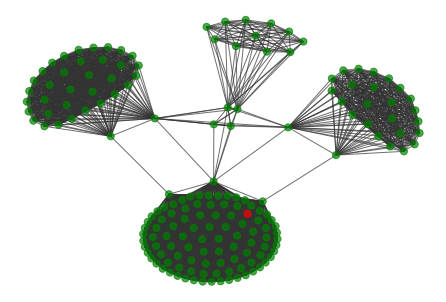

In [65]:
nx.draw_kamada_kawai(sub_graph, node_size=50, alpha=0.7, node_color=colors, edge_color=[.2,.2,.2,0.3], edge_width=0.5)

In [49]:
def pre_simulate(weeks, step_size = 7)
    pop_matrix = simp.init_infection()
    actions=weeks*['Unrestricted']
    days=step_size*len(actions)
    for day in tqdm(range(1, days+1)):
        #if less than 20% still susceptible, break simulation
        if pop_matrix[np.where(pop_matrix[:,1] == -1)].shape[0] > pop_matrix.shape[0]*.9: break            


        # Choose a new policy at each week
        if day % step_size == 1:             
            restrictions = city_restrictions[actions[int(day/7)]]

        pop_matrix = simp.spread_infection(pop_matrix, restrictions, day)
        pop_matrix = simp.lambda_leak_expose(pop_matrix, day)
        pop_matrix = simp.update_population(pop_matrix)

    return pop_matrix

    
def simulate(pop_matrix, actions, step_size = 7, days = 364):
    data = []    
    
    for day in tqdm(range(1, days+1)):
        #if less than 20% still susceptible, break simulation
        if pop_matrix[np.where(pop_matrix[:,1] == -1)].shape[0] > pop_matrix.shape[0]*.9: break            
            
        
        # Choose a new policy at each week
        if day % step_size == 1:
            restrictions = city_restrictions[actions[int(day/7)]]

        pop_matrix = simp.spread_infection(pop_matrix, restrictions, day)
        pop_matrix = simp.lambda_leak_expose(pop_matrix, day)
        pop_matrix = simp.update_population(pop_matrix)

        data.append(np.array(sorted(pop_matrix,key=lambda x: x[0]))[:,1]) 
    
    return data

100%|██████████████████████████████████████████████████████████████████████████████████| 42/42 [00:01<00:00, 25.36it/s]


In [68]:
data = simulate(pop_matrix, actions=50*['Unrestricted'], days=120)

100%|████████████████████████████████████████████████████████████████████████████████| 120/120 [00:30<00:00,  3.95it/s]


In [74]:
import matplotlib.pyplot as plt

c:\anaconda\envs\cmdp\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


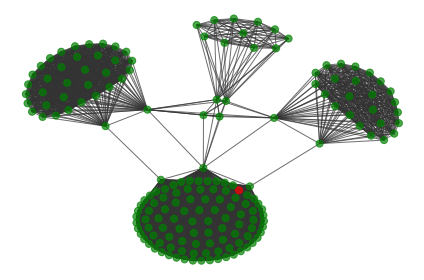

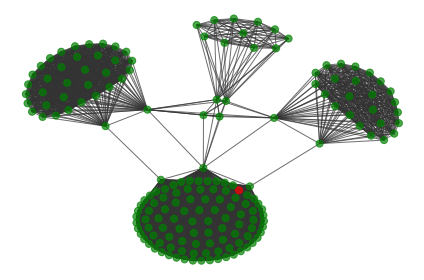

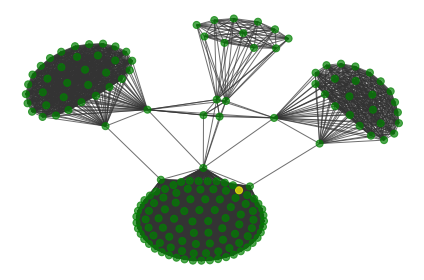

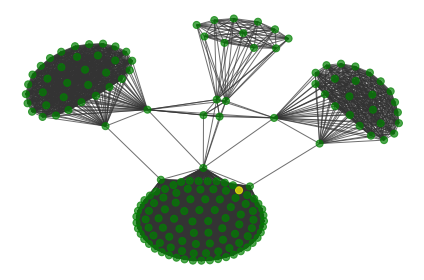

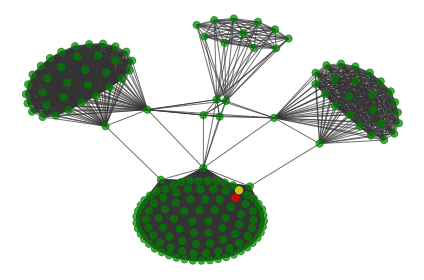

...

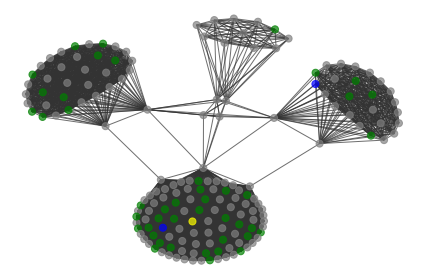

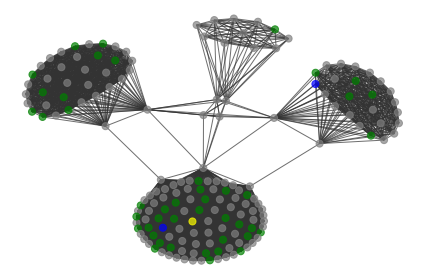

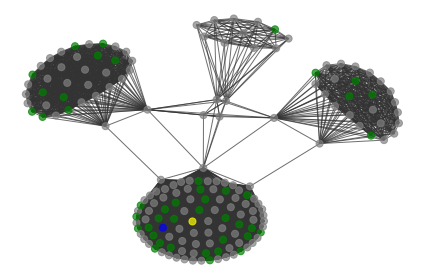

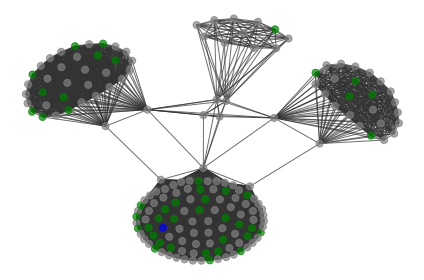

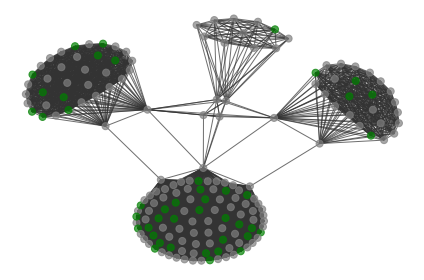

In [84]:
pos = nx.kamada_kawai_layout(sub_graph)
for i,d in enumerate(data):
    _, ax = plt.subplots()
    colors = ['green' if d[n]==0
               else 'red' if d[n]==1
               else 'yellow' if d[n]==2
               else 'blue' if d[n]==3
               else 'gray' 
               for n in sub_graph        
    ]
    nx.draw(sub_graph, pos=pos, ax=ax,
                         node_size=50, alpha=0.7, node_color=colors, edge_color=[.2,.2,.2,0.3], edge_width=1)
    plt.tight_layout();
    plt.savefig(f'anim_spread/anim_infection_{i}.png', dpi=400, bbox_inches = 'tight',pad_inches = 0);

In [7]:
pop_matrix

array([[ 1.0000e+00,  0.0000e+00, -1.0000e+00, -1.0000e+00,  5.9000e+01],
       [ 2.0000e+00,  0.0000e+00, -1.0000e+00, -1.0000e+00,  2.1000e+01],
       [ 3.0000e+00,  0.0000e+00, -1.0000e+00, -1.0000e+00,  3.7000e+01],
       ...,
       [ 5.1183e+04,  1.0000e+00,  0.0000e+00,  3.0000e+00,  5.9000e+01],
       [ 5.1186e+04,  1.0000e+00,  0.0000e+00,  2.0000e+00,  2.0000e+01],
       [ 5.1294e+04,  1.0000e+00,  0.0000e+00,  8.0000e+00,  3.4000e+01]])

array([ 7679.,  7692.,  7791.,  7889.,  8086.,  8100.,  8256.,  8474.,
        8505.,  8649., 12036., 12071., 12075., 12218., 12284., 12668.,
       12726., 12785., 13053., 13253., 50495., 50545., 50575., 50586.,
       50646., 50783., 51061., 51183., 51186., 51294.])

In [16]:
[n for n in simp.G if pop_matrix[pop_matrix[:,0] == n][0][1] == 1]

[7679,
 7692,
 7791,
 7889,
 8086,
 8100,
 8256,
 8474,
 8505,
 8649,
 12036,
 12071,
 12075,
 12218,
 12284,
 12668,
 12726,
 12785,
 13053,
 13253,
 50495,
 50545,
 50575,
 50586,
 50646,
 50783,
 51061,
 51183,
 51186,
 51294]

In [10]:
from joblib import Parallel, delayed

actions = (['Social Distancing']+['Light Quarantine'])
sims = Parallel(n_jobs=-1)(delayed(simulate)(pop_matrix=pop_matrix, actions=actions) 
                           for i in range(48))

In [11]:
for i in range(0, 29):
    fig = make_beds_graph(sims[0], actions, 7, '')
    for data in sims:
        data = pd.DataFrame([pd.Series(d).value_counts() for d in data])
        pop = data.iloc[0].sum()
        data=data[3].fillna(0)/pop
        x = list(range(i))
        fig.add_trace(go.Scatter(x=x, y=data.iloc[:i], name='hospitalized', mode='lines',
                                 line_color = 'rgb(0.25, 0.41, 0.88)', line=dict(width=2.5),
                                 opacity=0.85
                                ))
    fig.write_image(f"anims/sim_2_weeks_2_{i}.png", scale=3)
